# Dinámica en Redes: cómo la estructura determina la difusión

En esta práctica vamos a explorar una idea central en ciencia de redes:

> **La dinámica depende fuertemente de la estructura de la red.**

En este contexto, entendemos como dinámica lo siguiente. Supongamos que cada nodo de nuestra red posee una propiedad o un estado determinado. Supongamos además que existen reglas para la actualización de este estado: por ejemplo, con determinada probabilidad cambia de estado viendo el de sus vecinos, por decir algo. Por lo tanto, estudiar la dinámica de este sistema es estudiar la fracción de nodos en cada uno de los estados posibles a lo largo que hacemos evolucionar el sistema.

Como en general las reglas de cambio de estado están ligadas a evaluar cuál es el estado de un nodo y sus vecinos, será importante analizar cómo varía la evolución de los sistemas dependiendo de las estructuras de las redes estudiadas. Por lo tanto, vamos a comparar tres tipos de redes:

- Erdős–Rényi (aleatoria)
- Watts–Strogatz (small-world)
- Barabási–Albert (scale-free)

Y vamos a estudiar dos dinámicas en particular, aunque otras más complejas pueden estudiarse de forma análoga. Las que trabajaremos son:

- Modelo SIR (epidemias)
- Independent Cascade (cascadas de información)

---

## Preguntas guía

Antes de empezar, pensá:

- ¿En qué red esperás que la infección se propague más rápido?
- ¿Qué rol juegan los "hubs"?
- ¿Importa dónde empieza la difusión?

Vamos a intentar responder estas preguntas con simulaciones.

In [ ]:
!pip install networkx matplotlib ipywidgets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.6 MB/s eta 0:00:00


In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import random

from ipywidgets import interact, FloatSlider, IntSlider, Dropdown

In [ ]:
# HACEMOS REDES PROTOTIPO COMPARABLES (CON MISMO NUMERO DE NODOS n Y NUMERO DE ENLACES l)

def generate_graph(graph_type, n=300, l=900):
    if graph_type == "ER":
        #return nx.erdos_renyi_graph(n, 0.02)
        return nx.gnm_random_graph(n, l)
    elif graph_type == "WS":
        grado_medio = 2 * l/n
        return nx.watts_strogatz_graph(n, k=int(grado_medio), p=0.03)
    elif graph_type == "BA":
        grado_medio = 2 * l/n
        m0 = int(round(grado_medio / (2 - 1 / n)))
        return nx.barabasi_albert_graph(n, m=m0)


# Modelo SIR (Susceptible–Infectado–Recuperado)

El modelo SIR es un modelo clásico en epidemiología, utilizado para enfermedades donde los individuos pueden generar inmunidad luego de ser infectados.

En particular, cada individuo, es decir, cada nodo en nuestra red, puede estar en uno de tres estados (excluyentes entre sí):

- **S (Susceptible):** puede infectarse
- **I (Infectado):** puede contagiar a sus vecinos
- **R (Recuperado):** ya no participa en la dinámica

### Dinámica - reglas de contagio

En cada paso de tiempo:

1. Cada nodo infectado intenta contagiar a sus vecinos susceptibles con probabilidad **β**
2. Cada nodo infectado se recupera con probabilidad **γ**

*Intución:*

  subir β → transición brusca

  subir γ → epidemia muere

### Ideas clave

- La propagación depende de la estructura de la red
- Existe un balance entre infección (β) y recuperación (γ)
- Puede aparecer un “pico” de infectados

### Aplicaciones

- Epidemiología
- Difusión de información
- Modelos simplificados de actividad biológica

In [ ]:
# Función para correr una epidemia en una red con el modelo SIR, lo que nos devuelve es la historia de cada nodo a lo largo de la simulación
def run_sir(G, beta=0.05, gamma=0.02, initial_infected=3, steps=50):
    states = {node: "S" for node in G.nodes()} # inicialmente, todos los nodos son susceptibles

    infected = random.sample(list(G.nodes()), initial_infected) # se asigna una cantidad inicial de infectados
    for i in infected:
        states[i] = "I"

    history = []

    for _ in range(steps):
        new_states = states.copy()

        for node in G.nodes():
            if states[node] == "I":
                for neighbor in G.neighbors(node):
                    if states[neighbor] == "S" and random.random() < beta:
                        new_states[neighbor] = "I"

                if random.random() < gamma:
                    new_states[node] = "R"

        states = new_states

        counts = {
            "S": sum(1 for s in states.values() if s == "S"),
            "I": sum(1 for s in states.values() if s == "I"),
            "R": sum(1 for s in states.values() if s == "R"),
        }
        history.append(counts)

    return history

## Simular SIR en distintos tipos de redes

Experimento 1 — Mismos parámetros, topologías diferentes

Fijar β, γ

- Comparar: ER vs WS vs BA

- Graficar: Fracción infectada a lo largo del tiempo

In [ ]:
def simulate_sir(graph_type, beta, gamma, initial_infected):

    G = generate_graph(graph_type)
    history = run_sir(G, beta, gamma, initial_infected)

    S = [h["S"]/len(G) for h in history]
    I = [h["I"]/len(G) for h in history]
    R = [h["R"]/len(G) for h in history]

    plt.figure(figsize=(8,5))
    plt.plot(S, label="Susceptibles")
    plt.plot(I, label="Infectados")
    plt.plot(R, label="Recuperados")

    plt.title(f"SIR en red {graph_type}")
    plt.xlabel("Tiempo")
    plt.ylabel("Fracción de nodos")
    plt.legend()
    plt.show()


interact(
    simulate_sir,
    graph_type=Dropdown(options=["ER", "WS", "BA"], value="ER"),
    beta=FloatSlider(value=0.05, min=0.01, max=0.2, step=0.01),
    gamma=FloatSlider(value=0.02, min=0.0, max=0.1, step=0.01),
    initial_infected=IntSlider(value=3, min=1, max=10)
)

interactive(children=(Dropdown(description='graph_type', options=('ER', 'WS', 'BA'), value='ER'), FloatSlider(…

<function __main__.simulate_sir(graph_type, beta, gamma, initial_infected)>

## Efecto del nodo inicial

Experimento 2 — Rol de los *hubs*

Comenzar la infección desde un nodo al azar o de un nodo de alto grado.

Cómo cambia esto dependiendo de la topología de la red?

In [ ]:
def sir_compare_seed(graph_type, beta=0.05, gamma=0.02):

    G = generate_graph(graph_type)

    def run(seed_node):
        states = {node: "S" for node in G.nodes()}
        states[seed_node] = "I"

        history = []

        for _ in range(40):
            new_states = states.copy()

            for node in G.nodes():
                if states[node] == "I":
                    # infección
                    for neighbor in G.neighbors(node):
                        if states[neighbor] == "S" and random.random() < beta:
                            new_states[neighbor] = "I"

                    # recuperación
                    if random.random() < gamma:
                        new_states[node] = "R"

            states = new_states

            infected = sum(1 for s in states.values() if s == "I")
            history.append(infected / len(G))

        return history

    # nodo hub
    hub_node = max(G.degree, key=lambda x: x[1])[0]
    hub_curve = run(hub_node)

    # nodo aleatorio
    random_node = random.choice(list(G.nodes()))
    rand_curve = run(random_node)

    # plot
    plt.figure(figsize=(8,5))
    plt.plot(hub_curve, label="Inicio en hub")
    plt.plot(rand_curve, label="Inicio aleatorio")

    plt.title(f"{graph_type}: efecto del nodo inicial")
    plt.xlabel("Tiempo")
    plt.ylabel("Fracción infectada")
    plt.legend()
    plt.show()

In [ ]:
interact(
    sir_compare_seed,
    graph_type=Dropdown(options=["ER", "WS", "BA"], value="BA"),
    beta=FloatSlider(value=0.05, min=0.01, max=0.2, step=0.01),
    gamma=FloatSlider(value=0.02, min=0.0, max=0.1, step=0.01)
)

interactive(children=(Dropdown(description='graph_type', index=2, options=('ER', 'WS', 'BA'), value='BA'), Flo…

<function __main__.sir_compare_seed(graph_type, beta=0.05, gamma=0.02)>

En redes BA:
- con β alto + hub → explosión inmediata
- Aumentando γ:
la epidemia muere rápido incluso desde hubs

BA :
Gran diferencia entre hub vs aleatorio
El hub dispara epidemias mucho más rápido

ER:
Diferencia mucho menor. Red más homogénea

WS: Intermedio, depende del rewiring

## Animación de la difusión

Ahora vamos a visualizar directamente cómo se propaga la infección en la red.

Colores:
- Azul: Susceptible
- Rojo: Infectado
- Verde: Recuperado

Esto permite ver:
- El rol de hubs
- La estructura local
- Diferencias entre topologías

In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML


In [ ]:
def animate_sir(graph_type="BA", beta=0.05, gamma=0.02, steps=30):

    G = generate_graph(graph_type, n=150)
    pos = nx.spring_layout(G, seed=42)

    states = {node: "S" for node in G.nodes()}
    initial = random.sample(list(G.nodes()), 3)
    for i in initial:
        states[i] = "I"
    plt.ioff()
    fig, ax = plt.subplots(figsize=(6,6))

    def update(frame):
        ax.clear()

        new_states = states.copy()

        for node in G.nodes():
            if states[node] == "I":
                for neighbor in G.neighbors(node):
                    if states[neighbor] == "S" and random.random() < beta:
                        new_states[neighbor] = "I"
                if random.random() < gamma:
                    new_states[node] = "R"

        for k in states:
            states[k] = new_states[k]

        color_map = []
        for node in G.nodes():
            if states[node] == "S":
                color_map.append("blue")
            elif states[node] == "I":
                color_map.append("red")
            else:
                color_map.append("green")

        nx.draw(G, pos, node_color=color_map, node_size=40, ax=ax)

        ax.set_title(f"{graph_type} - paso {frame}")
        ax.axis("off")


    ani = animation.FuncAnimation(fig, update, frames=steps, interval=500, )
    plt.close(fig)
    return HTML(ani.to_jshtml())


In [ ]:
interact(
    animate_sir,
    graph_type=Dropdown(options=["ER", "WS", "BA"], value="BA"),
    beta=FloatSlider(value=0.05, min=0.01, max=0.2, step=0.01),
    gamma=FloatSlider(value=0.02, min=0.0, max=0.1, step=0.01),
    steps=IntSlider(value=30, min=10, max=60)
)

interactive(children=(Dropdown(description='graph_type', index=2, options=('ER', 'WS', 'BA'), value='BA'), Flo…

<function __main__.animate_sir(graph_type='BA', beta=0.05, gamma=0.02, steps=30)>

## Comparación directa entre topologías

Ahora comparamos las tres redes en una sola figura.

Esto permite ver claramente:

- Velocidad de propagación
- Pico de infección
- Diferencias estructurales

👉 Esta es probablemente la figura más importante de la clase.

In [ ]:
def compare_networks(beta=0.05, gamma=0.02, runs=5):

    graph_types = ["ER", "WS", "BA"]
    n = 300

    plt.figure(figsize=(10,6))

    for gtype in graph_types:

        all_runs = []

        for _ in range(runs):
            G = generate_graph(gtype, n)
            history = run_sir(G, beta, gamma)

            infected = [h["I"]/len(G) for h in history]
            all_runs.append(infected)

        # Promedio (rellenando longitudes distintas)
        max_len = max(len(r) for r in all_runs)
        padded = [r + [r[-1]]*(max_len - len(r)) for r in all_runs]

        mean_curve = np.mean(padded, axis=0)

        plt.plot(mean_curve, label=gtype)

    plt.xlabel("Tiempo")
    plt.ylabel("Fracción infectada")
    plt.title("Comparación SIR entre topologías")
    plt.legend()
    plt.show()


In [ ]:
interact(
    compare_networks,
    beta=FloatSlider(value=0.05, min=0.01, max=0.2, step=0.01),
    gamma=FloatSlider(value=0.02, min=0.0, max=0.1, step=0.01),
    runs=IntSlider(value=5, min=1, max=20)
)

interactive(children=(FloatSlider(value=0.05, description='beta', max=0.2, min=0.01, step=0.01), FloatSlider(v…

<function __main__.compare_networks(beta=0.05, gamma=0.02, runs=5)>

¿Qué observan?
¿Cómo se comporta la epidemia en el modelo WS, comparado con BA y ER?

# Modelo Independent Cascade

El modelo Independent Cascade describe cómo se propaga una “cascada” (información, influencia, adopción) en una red (acá el [trabajo original](https://theoryofcomputing.org/articles/v011a004/v011a004.pdf))

Cada nodo puede estar en uno de dos estados:

- **Inactivo**
- **Activo**

### Dinámica

- Se comienza con un conjunto inicial de nodos activos
- Cuando un nodo se activa, tiene **una única oportunidad** de activar a cada vecino inactivo con probabilidad **p**
- Si falla, no vuelve a intentar

### Ideas clave

- La propagación es **irreversible**
- El proceso suele detenerse rápidamente
- Los nodos con muchos vecinos (hubs) pueden disparar grandes cascadas

### Aplicaciones

- Redes sociales (viralización)
- Marketing
- Difusión de innovaciones

In [ ]:
def independent_cascade(G, p=0.1, steps=20):
    active = set(random.sample(list(G.nodes()), 3))
    history = [len(active)/len(G)]

    for _ in range(steps):
        new_active = set(active)

        for node in active:
            for neighbor in G.neighbors(node):
                if neighbor not in active:
                    if random.random() < p:
                        new_active.add(neighbor)

        if new_active == active:
            break

        active = new_active
        history.append(len(active)/len(G))

    return history

In [ ]:
def simulate_cascade(graph_type, p):

    G = generate_graph(graph_type)
    history = independent_cascade(G, p)

    plt.figure(figsize=(8,5))
    plt.plot(history)

    plt.title(f"Independent Cascade en red {graph_type}")
    plt.xlabel("Tiempo")
    plt.ylabel("Fracción activa")
    plt.show()


interact(
    simulate_cascade,
    graph_type=Dropdown(options=["ER", "WS", "BA"]),
    p=FloatSlider(value=0.1, min=0.01, max=0.5, step=0.01)
)

interactive(children=(Dropdown(description='graph_type', options=('ER', 'WS', 'BA'), value='ER'), FloatSlider(…

<function __main__.simulate_cascade(graph_type, p)>

## Ejemplo de implementación en una red real

En este ejemplo exploraremos la red de personajes de Game of Thrones y simularemos la difusión de información y la maximización de influencia en la red. Nos basamos en [este trabajo](https://github.com/dimgold/pycon_social_networkx).


Andrew J. Beveridge, profesor asociado de matemáticas en Macalester College, y su estudiante Jie Shan, crearon una red a partir del libro *A Storm of Swords* extrayendo relaciones entre personajes para descubrir los personajes más importantes del libro.

El conjunto de datos está disponible públicamente para los 5 libros en https://github.com/mathbeveridge/asoiaf.

La red de interacción se creó conectando dos personajes cada vez que sus nombres (o apodos) aparecían con una diferencia de 15 palabras entre sí en uno de los libros. El peso del enlace corresponde al número de interacciones.

Credits:

Blog: https://networkofthrones.wordpress.com

Math Horizons Article: https://www.maa.org/sites/default/files/pdf/Mathhorizons/NetworkofThrones%20%281%29.pdf

Mridul Seth: https://github.com/MridulS/pydata-networkx/


In [ ]:
import matplotlib as mpl
import pandas as pd
import numpy as np
import warnings
from collections import Counter
import sys
import os
from __future__ import division
plt.rcParams["figure.figsize"] = (20,10)
import tqdm as tqdm

warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

### Carguemos el dataset

Hay que cargarlo y trabajarlo un poco para obtener un grafo

In [ ]:
!wget -O got.zip https://www.dropbox.com/scl/fi/43u8pvuui4exmtr2vvt9g/asoiaf-master.zip?rlkey=93vngbv7zpmhvdsd7gtshc365&dl=0
!unzip -o got.zip

--2026-04-20 19:52:32--  https://www.dropbox.com/scl/fi/43u8pvuui4exmtr2vvt9g/asoiaf-master.zip?rlkey=93vngbv7zpmhvdsd7gtshc365
Resolving www.dropbox.com (www.dropbox.com)... 162.125.5.18, 2620:100:6017:18::a27d:212
Connecting to www.dropbox.com (www.dropbox.com)|162.125.5.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc80d61f611e9e235f086a3980b1.dl.dropboxusercontent.com/cd/0/inline/C-_2ufLlQiE32O0DKCbeoF3R3EnEP8KyENSILWmuoBGSmH6YApbBZzr3M2W3yYEuYLumtcc-cEJaO6zsef7S2l0xL-IvXwjVjwAKWyt9ptkzcOrKzMv2hEMM9Il2Gz6qsmcNj1Gsp7Usze6a3MC-kth8/file# [following]
--2026-04-20 19:52:33--  https://uc80d61f611e9e235f086a3980b1.dl.dropboxusercontent.com/cd/0/inline/C-_2ufLlQiE32O0DKCbeoF3R3EnEP8KyENSILWmuoBGSmH6YApbBZzr3M2W3yYEuYLumtcc-cEJaO6zsef7S2l0xL-IvXwjVjwAKWyt9ptkzcOrKzMv2hEMM9Il2Gz6qsmcNj1Gsp7Usze6a3MC-kth8/file
Resolving uc80d61f611e9e235f086a3980b1.dl.dropboxusercontent.com (uc80d61f611e9e235f086a3980b1.dl.dropboxusercontent.com)... 162.125.5.15, 2

In [ ]:
books = []
for i in range(5):
    books.append(pd.read_csv('asoiaf-master/data/asoiaf-book{}-edges.csv'.format(i+1)))
all_books = pd.concat(books)
all_books.head()

,Source,Target,Type,weight,book
0,Addam-Marbrand,Jaime-Lannister,Undirected,3,1.0
1,Addam-Marbrand,Tywin-Lannister,Undirected,6,1.0
2,Aegon-I-Targaryen,Daenerys-Targaryen,Undirected,5,1.0
3,Aegon-I-Targaryen,Eddard-Stark,Undirected,4,1.0
4,Aemon-Targaryen-(Maester-Aemon),Alliser-Thorne,Undirected,4,1.0


Podemos colapsar todos libros en único grafo, teniendo entonces una red agregada para todo el dataset.

In [ ]:
edges = all_books.groupby(['Source','Target']).agg({'weight':'sum'}).reset_index()
edges.sort_values('weight',ascending=False).head()

,Source,Target,weight
1334,Eddard-Stark,Robert-Baratheon,334
2031,Jon-Snow,Samwell-Tarly,228
1965,Joffrey-Baratheon,Sansa-Stark,222
1972,Joffrey-Baratheon,Tyrion-Lannister,219
946,Cersei-Lannister,Tyrion-Lannister,209


Utilizamos una función específica de networkx para armar el grafo.

In [ ]:
GOT = nx.from_pandas_edgelist(edges,
                            source='Source',
                            target='Target',
                            edge_attr='weight' )

Este grafo tiene las siguientes características

In [ ]:
print(GOT)

Graph with 796 nodes and 2823 edges


In [ ]:
weighted_degrees = dict(nx.degree(GOT,weight='weight'))
max_degree = max(weighted_degrees.values())

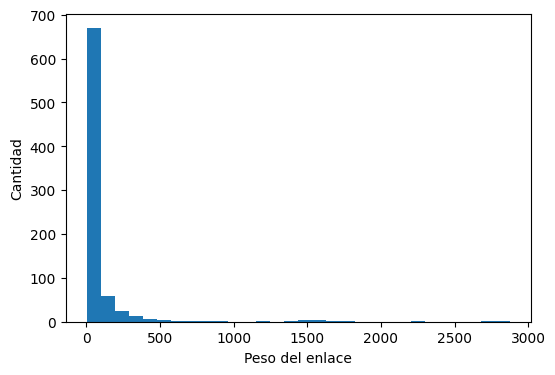

In [ ]:
plt.figure(figsize=(6,4))
h = plt.hist(weighted_degrees.values(), bins = 30)
plt.xlabel('Peso del enlace')
plt.ylabel('Cantidad')
plt.show()

Para analizar rápidamente el dataset, vamos a quedarnos con una red reducida, filtrando por el grado pesado de los nodos, quedándonos únicamente con aquellos que tienen un grado pesado mayor que 200.

In [ ]:
subG = GOT.subgraph([n for n in weighted_degrees if weighted_degrees[n]>200])
print(subG)
pos = nx.spring_layout(subG,weight='weight',iterations=20, k = 4)

Graph with 63 nodes and 496 edges


Visualicemos el grafo

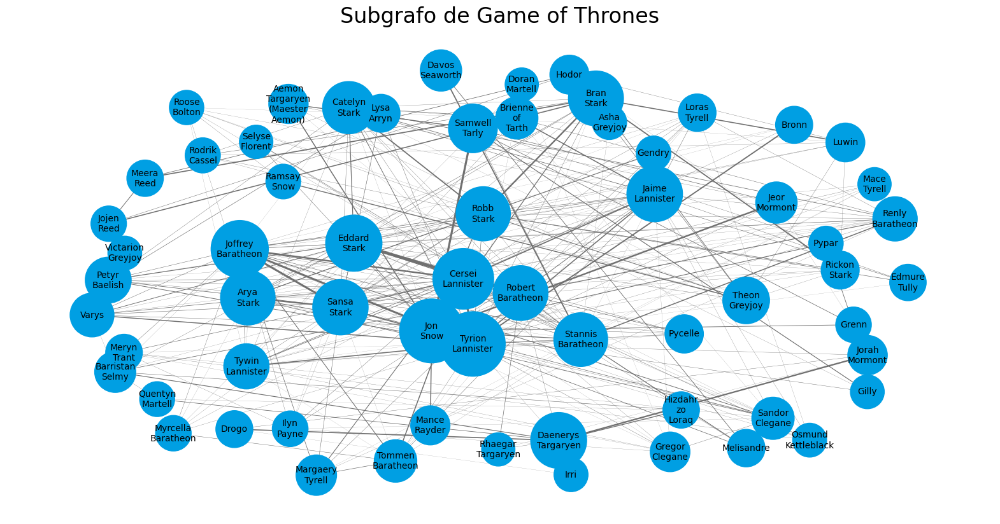

In [ ]:
plt.axis('off')
plt.title('Subgrafo de Game of Thrones',fontsize = 24)


node_size = [100*weighted_degrees[n] ** .5 for n in subG.nodes()]
nx.draw_networkx_nodes(subG, pos, nodelist = subG.nodes(),node_size=node_size, node_color='#009fe3')

nx.draw_networkx_labels(subG,pos,{n:n.replace('-','\n') for n in subG.nodes() if weighted_degrees[n]>100},font_size=10);

edge_width = [e[2]['weight']/100 if e[2]['weight']> 10 else 0 for e in subG.edges(data = True)]
nx.draw_networkx_edges(subG, pos, subG.edges(), width = edge_width, edge_color='#707070')

plt.show()

### Cascade model en GOT
Adjuntamos además otra función para simular el cascade model que nos viene mejor para este ejemplo

In [ ]:
def independent_cascade(G,t,infection_times):
    # haciendo un paso t->t+1 de la simulación de cascadas indpendiente
    # Cada nodo infectado a tiempo t contagia a sus vecinos en t+1 con una probabilidad propocional al peso del enlace entre ellos

    max_weight = max([e[2]['weight'] for e in G.edges(data=True)]) # busco el peso máximo de los enlaces de la red, max_weight
    current_infectious = [n for n in infection_times if infection_times[n]==t]
    for n in current_infectious: # Para cada nodo n infectado a tiempo t
        for v in G.neighbors(n): # Busco sus vecinos v
            if v not in infection_times: # Si uno de los v no está infectado
                if  G.get_edge_data(n,v)['weight'] >= np.random.random()*max_weight: # Si el peso de del enlace n->v supera un valor al azar entre 0 y max_weight
                    infection_times[v] = t+1 # infecto al nodo v
    return infection_times
def plot_G(G,pos,infection_times,t):
    current_infectious = [n for n in infection_times if infection_times[n]==t]
    plt.figure()
    plt.axis('off')
    plt.title('Subgrafo de Game of Thrones, t={}'.format(t),fontsize = 24)

    for node in G.nodes():
        size = 100*weighted_degrees[node]**0.5
        if node in current_infectious:
            ns = nx.draw_networkx_nodes(G,pos,nodelist=[node], node_size=size, node_color='#feba02')
        elif infection_times.get(node,9999999)<t:
            ns = nx.draw_networkx_nodes(G,pos,nodelist=[node], node_size=size, node_color='#f2f6fa')
        else:
            ns = nx.draw_networkx_nodes(G,pos,nodelist=[node], node_size=size, node_color='#009fe3')
        ns.set_edgecolor('#f2f6fa')
    nx.draw_networkx_labels(G,pos,{n:n.replace('-','\n') for n in G.nodes() if weighted_degrees[n]>100},font_size=10);

    for e in G.edges(data=True):
        if e[2]['weight']>10:
            nx.draw_networkx_edges(G,pos,[e],width=e[2]['weight']/100,edge_color='#707070')
    plt.show()

Supongamos que Bran y Sam le cuentan un secreto a Jon Snow. ¿Quién se entarará?

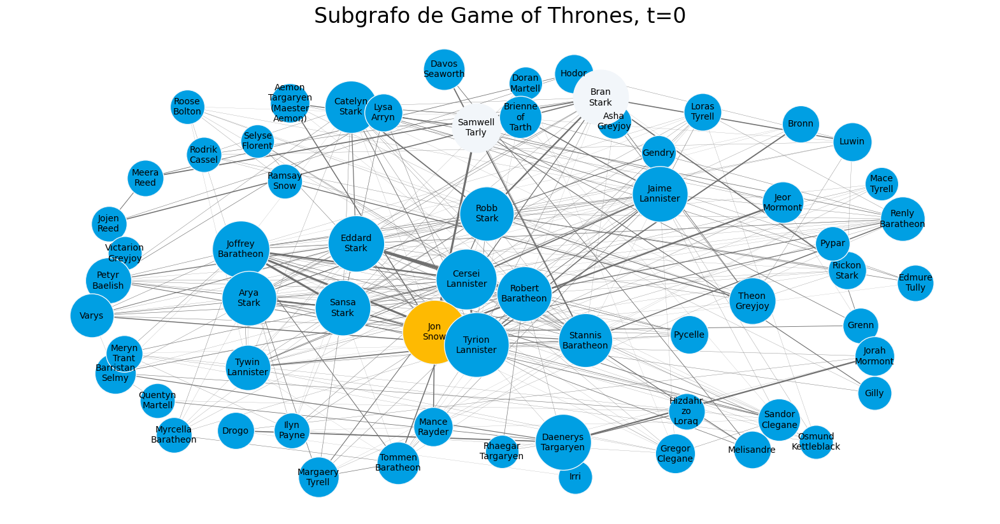

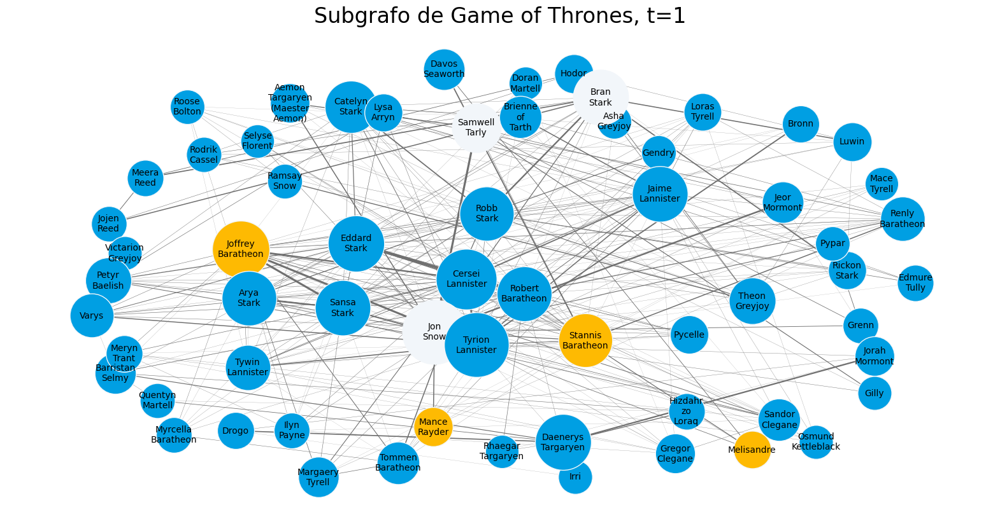

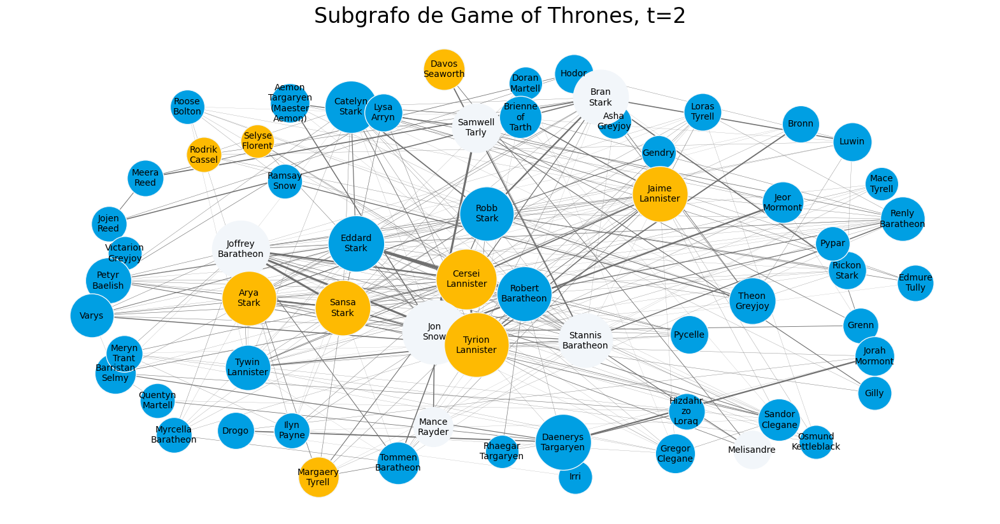

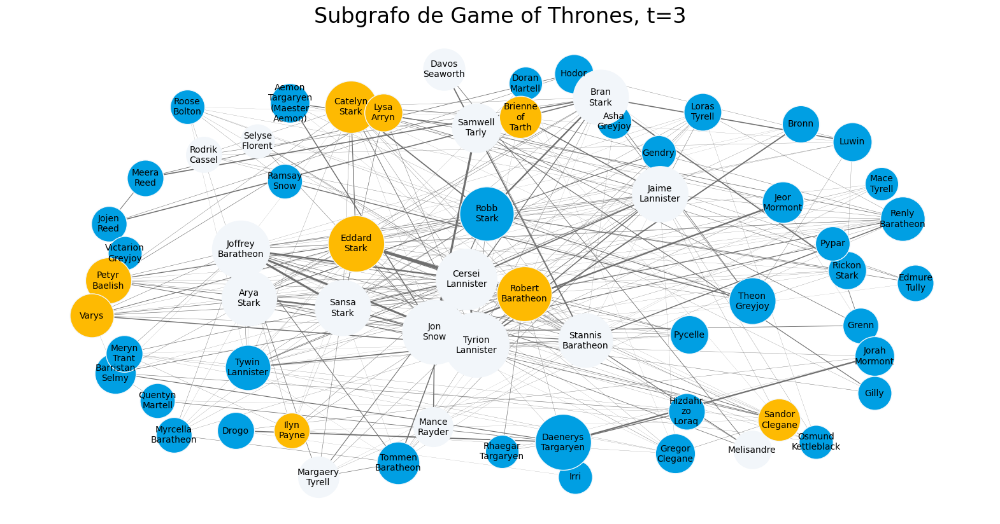

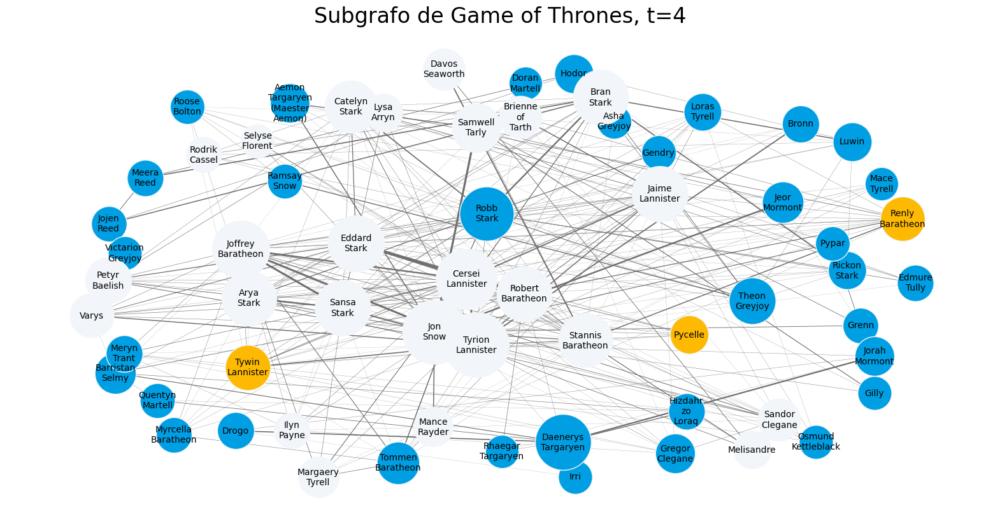

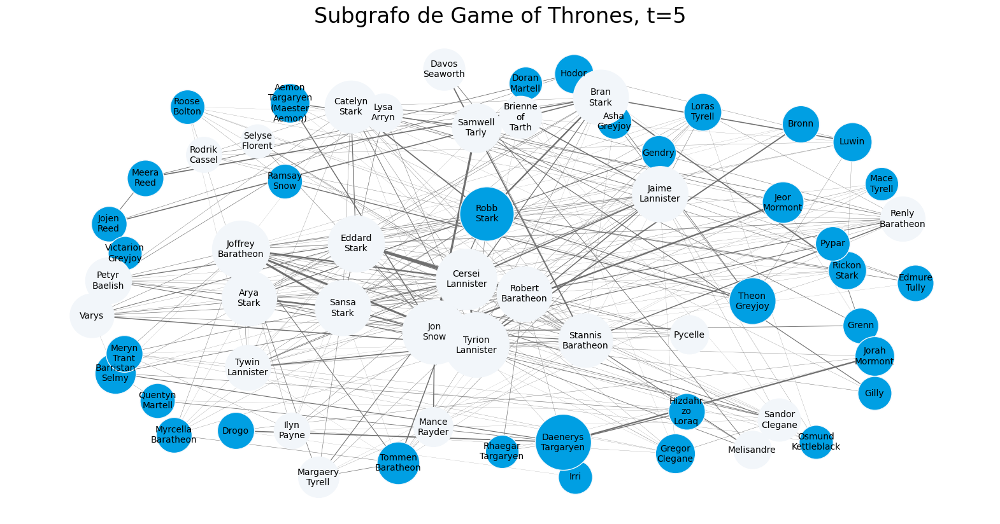

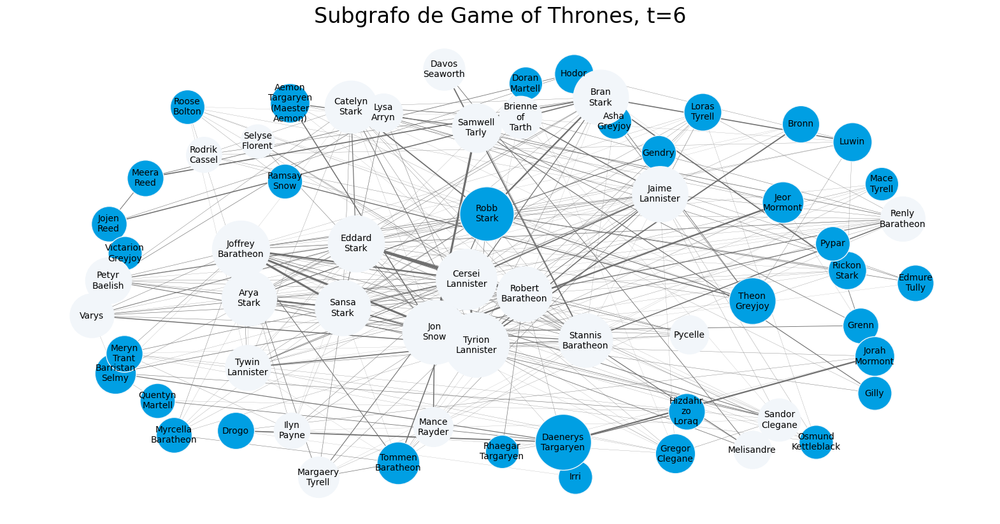

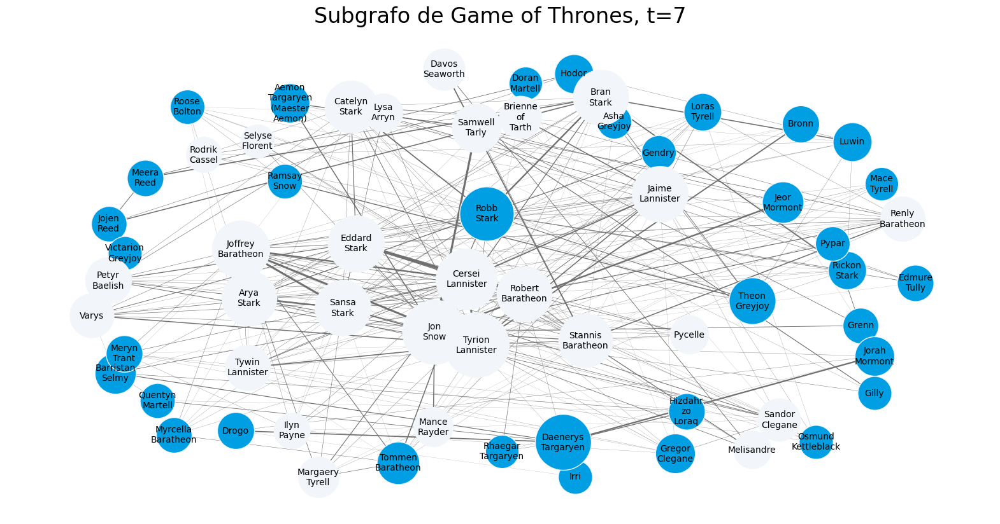

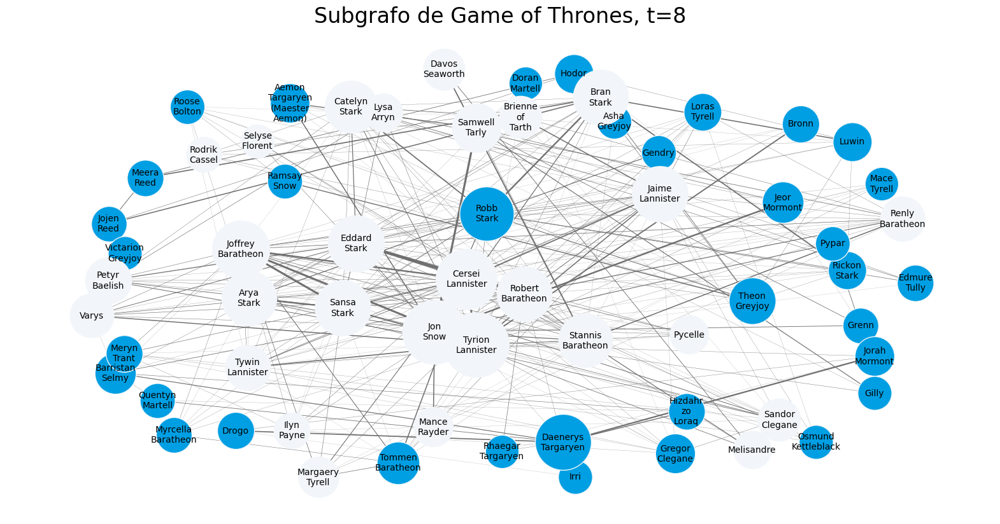

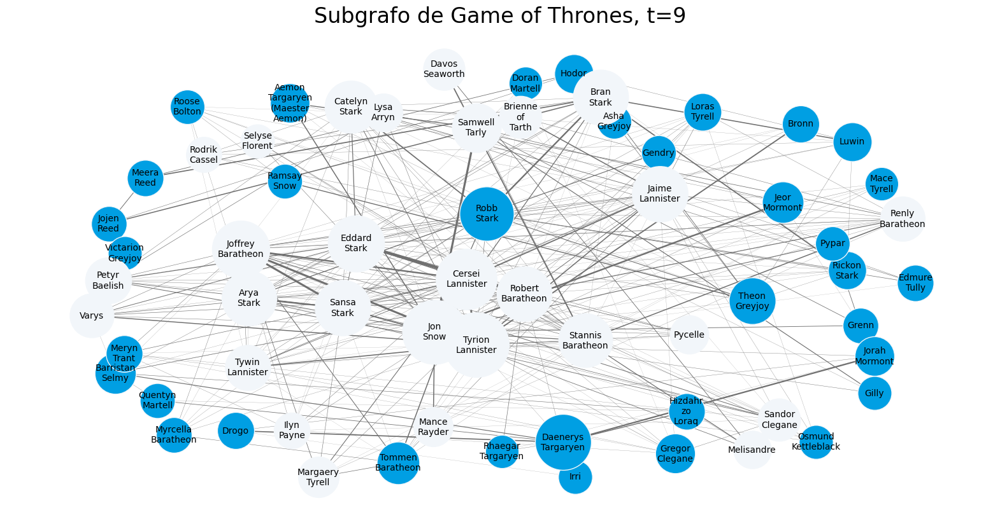

In [ ]:
infection_times = {'Bran-Stark':-1,'Samwell-Tarly':-1,'Jon-Snow':0}
for t in range(10):
    plot_G(subG,pos,infection_times,t)
    infection_times = independent_cascade(subG,t,infection_times)

Cambiemos un poco el foco y apuntemos a lo que se buscaba con este modelo originalmente: identificar nodos relevantes topológicamente para la propagación de información.

Veamos quiénes son los nodos influencers según métricas conocidas. Para ello calculo diferentes medidas de centralidad, y también agrego un valor de centralidad al azar para comparar (ojo! una única selección al azar, habría que hacer varias realizaciones al azar para tener un resultado fidedigno...)

In [ ]:
top = pd.DataFrame.from_dict(dict(nx.degree(subG)),orient='index').sort_values(0,ascending=False)
top.columns = ['Degree']
top['Weighted Degree'] =  pd.DataFrame.from_dict(dict(nx.degree(subG,weight='weight')),orient='index')
top['PageRank'] = pd.DataFrame.from_dict(dict(nx.pagerank(subG,weight='weight')),orient='index')
top['Betweenness'] =  pd.DataFrame.from_dict(dict(nx.betweenness_centrality(subG,weight='weight')),orient='index')

# AGREGO RANDOM:
nodeNames=[]
for node in subG.nodes():
  nodeNames.append(node)
randomSequence=np.random.permutation(len(subG))
top['Random']=pd.DataFrame.from_dict({nodeNames[ind]: value for ind,value in enumerate(randomSequence)},orient='index')
methods = top.columns
top.head()

,Degree,Weighted Degree,PageRank,Betweenness,Random
Tyrion-Lannister,40,1842,0.052707,0.036445,5
Robert-Baratheon,37,1271,0.037013,0.223912,28
Joffrey-Baratheon,35,1518,0.042825,0.033051,4
Eddard-Stark,34,1330,0.037788,0.024061,8
Cersei-Lannister,34,1627,0.046175,0.004671,62


Comparemos el efecto de seleccionar como seeds del modelo a nodos con centralidades altas

Definimos como budget al número total de nodos usados como seed en una simulación

Vamos a hacer 50 simulaciones, seleccionando budgets que van hasta un 10% del grafo total, y simulando la difusión hasta que no haya más cambios en el número de infectados.

Para cada budget, elijo a los nodos de mayor centralidad.

In [ ]:
max_budget = len(subG.nodes())
max_budget = int(len(subG.nodes())*.1)
trials = 50
all_results = []
for budget in tqdm.tqdm_notebook(range(max_budget)):
    results = {'budget':budget}
    for method in methods: # para cada método de centralidad
        infections = []
        for i in range(trials):
            infected = 0
            t= 0
            infection_times = {n:0 for n in top.sort_values(method,ascending=False).index[:budget]} # inicializa en 0 los budget items de acuerdo a los valores de centralidad
            while len(infection_times)>infected: # continuo mientras crezca el diccionario infection_times (si en una iteracion no infecté a nadie, para el loop)
                #t+=1
                infected = len(infection_times)
                infection_times = independent_cascade(subG,t,infection_times)
                t+=1
            infections.append(infected)
        results[method] = np.round(np.mean(infections)/len(subG.nodes()),2)

    all_results.append(results)


  0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
res_df = pd.concat([pd.DataFrame.from_dict(r,orient='index').T
                        for r in all_results]).set_index('budget')

res_df.index = res_df.index/len(subG.nodes())

res_df.head()

,Degree,Weighted Degree,PageRank,Betweenness,Random
budget,,,,,
0.000000,0.00,0.00,0.00,0.00,0.00
0.015873,0.50,0.51,0.50,0.51,0.49
0.031746,0.53,0.50,0.53,0.50,0.51
0.047619,0.51,0.49,0.54,0.52,0.55
0.063492,0.51,0.54,0.51,0.54,0.57


Veamos ahora cómo cambia la fracción de activados según el método

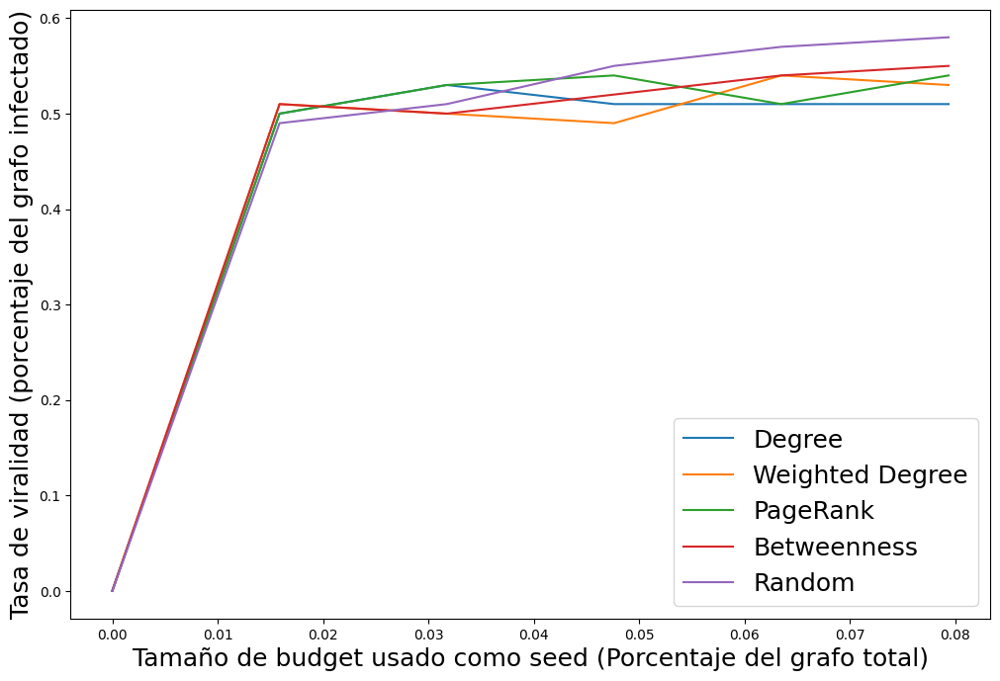

In [ ]:
res_df.plot(figsize=(12,8))
plt.legend(fontsize = 18)
plt.ylabel('Tasa de viralidad (porcentaje del grafo infectado)',fontsize = 18)
plt.xlabel('Tamaño de budget usado como seed (Porcentaje del grafo total)', fontsize = 18)
plt.show()

Al principio resulta sorprendente que la selección Random de este modelo pueda conducir a más activaciones que la selección basada en medidas de centralidad a medida que el budget crece.... Pero de hecho hay una explicación: El primer nodo elegido, si se elige eficientemente, activará una gran fracción de la red, en nuestro caso más del 50%. Sin embargo, cualquier nodo adicional que se elija sucesivamente sólo alcanzará una pequeña fracción adicional de la red. En particular, es muy probable que otros nodos centrales sean activados por el nodo elegido inicialmente y, como ya han sido activados, al elegirlos para que participen del budget no van a aumentar la difusión en la red.

Corolario: a medida que el budget crece, si la red no es lo suficientemente grande y heterogénea, los efectos beneficiosos de seleccionar nodos a través de su centralidad se empiezan a perder en el Independent Cascade Model.


Vamos a enfocarnos entonces en el caso de querer elegir un único nodo (*budget*=1) para viralizar la información:

In [ ]:
def eligiendoRandom(G,budget=1,trials=50):
# AHORA INFECTO budget NODOS AL AZAR Y VEO EL RESULTADO

  all_results = []
  infections = []

  nodeNames=[]
  for node in G.nodes():
    nodeNames.append(node)


  for i in range(trials):
    infected = 0
    t= 0
    randomSequence=np.random.permutation(len(G))
    r=randomSequence[:budget]


    infection_times =  {nodeNames[n]: 0 for n in r} #{n:0 for n in top.sort_values(method,ascending=False).index[:budget]} # inicializa en 0 los budget items
    while len(infection_times)>infected: # continuo mientras crezca el diccionario infection_times (si en una iteracion no infecté a nadie, para el loop)
      #t+=1
      infected = len(infection_times)
      infection_times = independent_cascade(subG,t,infection_times)
      t+=1
    infections.append(infected)
    results[method] = np.round(np.mean(infections)/len(subG.nodes()),2)
    all_results.append(np.round(np.mean(infections)/len(subG.nodes()),2))
  return(all_results)



In [ ]:
res=eligiendoRandom(subG,budget=1,trials=50)


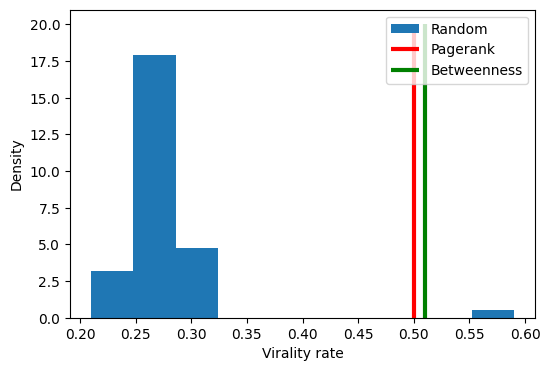

In [ ]:
plt.figure(figsize=(6,4))
h = plt.hist(res, bins = 10,density=True,label='Random')
plt.vlines(res_df['PageRank'].values[1],0,20,lw=3,color='r',label='Pagerank')
plt.vlines(res_df['Betweenness'].values[1],0,20,lw=3,color='g',label='Betweenness')
plt.xlabel('Virality rate')
plt.ylabel('Density')
plt.legend()

plt.show()

Vamos a buscar la mejor pareja de *seeds* (*budget*=2) usando fuerza bruta:

In [ ]:
from itertools import combinations

In [ ]:
budget=2
seed_sets = list(set(combinations(subG.nodes(),budget)))

print('Hay ', len(seed_sets),' opciones de seed para este budget')



Hay  1953  opciones de seed para este budget


In [ ]:
budget = 2
trials = 20
all_results = []
results = {'budget':budget}
for seed in tqdm.tqdm_notebook(seed_sets[:]):
    infections = []
    for i in range(trials):
        infected = 0
        t= 0
        infection_times = {n:0 for n in seed}
        while len(infection_times)>infected:
            #t+=1
            infected = len(infection_times)
            infection_times = independent_cascade(subG,t,infection_times)
            t+=1
        infections.append(infected)
    results[seed] = np.round(np.mean(infections)/len(subG.nodes()),2)

all_results.append(results)

  0%|          | 0/1953 [00:00<?, ?it/s]

Veamos los resultados

In [ ]:
sorted(results.items(), key = lambda x: x[1], reverse=True)[:10]

[('budget', 2),
 (('Quentyn-Martell', 'Sansa-Stark'), np.float64(0.58)),
 (('Jeor-Mormont', 'Joffrey-Baratheon'), np.float64(0.58)),
 (('Tommen-Baratheon', 'Jaime-Lannister'), np.float64(0.58)),
 (('Irri', 'Robert-Baratheon'), np.float64(0.57)),
 (('Robb-Stark', 'Jorah-Mormont'), np.float64(0.57)),
 (('Catelyn-Stark', 'Jon-Snow'), np.float64(0.57)),
 (('Joffrey-Baratheon', 'Barristan-Selmy'), np.float64(0.57)),
 (('Meryn-Trant', 'Stannis-Baratheon'), np.float64(0.56)),
 (('Renly-Baratheon', 'Rodrik-Cassel'), np.float64(0.56))]

In [ ]:
plt.figure(figsize=(6,4))
h = plt.hist(results.values(), bins = 10,density=True,label='Random')
plt.vlines(res_df['PageRank'].values[2],0,5,lw=3,color='r',label='Pagerank')
plt.vlines(res_df['Betweenness'].values[2],0,5,lw=3,color='g',label='Betweenness')
plt.xlabel('Virality rate')
plt.ylabel('Density')
plt.legend()

Vemos que si hubiésemos seleccionado a este par de nodos por medidas de centralidad hubiese tenido resutlados comparables a elegir el par óptimo por fuerza bruta...

¡Pero la búsqueda por fuerza bruta para este pequeño grafo de 63 nodos demora más de 10 minutos! No es escaleable...


# Conclusiones

Observamos que:

- Las redes **scale-free (BA)** permiten propagaciones muy rápidas debido a los hubs.
- Las redes **small-world (WS)** combinan clustering con caminos cortos → difusión eficiente.
- Las redes **aleatorias (ER)** muestran comportamientos más homogéneos.

---

## Ideas clave

- La topología no es un detalle: **determina la dinámica**
- Los hubs pueden dominar procesos dinámicos
- El punto inicial puede cambiar completamente el resultado

---

## Conexiones con ciencia de datos

Estos modelos aparecen en:

- Difusión de información (redes sociales)
- Epidemiología
- Sistemas biológicos (actividad neuronal, difusión sináptica)
- Marketing viral

---

## Pregunta abierta

¿Cómo cambiarían estos resultados si:

- Las conexiones tuvieran pesos?
- Los nodos fueran heterogéneos?
- La red evolucionara en el tiempo?
